In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
import plotly.express as px
%matplotlib inline
import functools as f
import plotly.graph_objects as go
import missingno as msno
import dash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

<ipython-input-1-f014a1920623>:11: UserWarning: 
The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`
  import dash_core_components as dcc
<ipython-input-1-f014a1920623>:12: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  import dash_html_components as html


In [2]:
df = pd.read_csv('Meteorite_Landings.csv')

<AxesSubplot:>

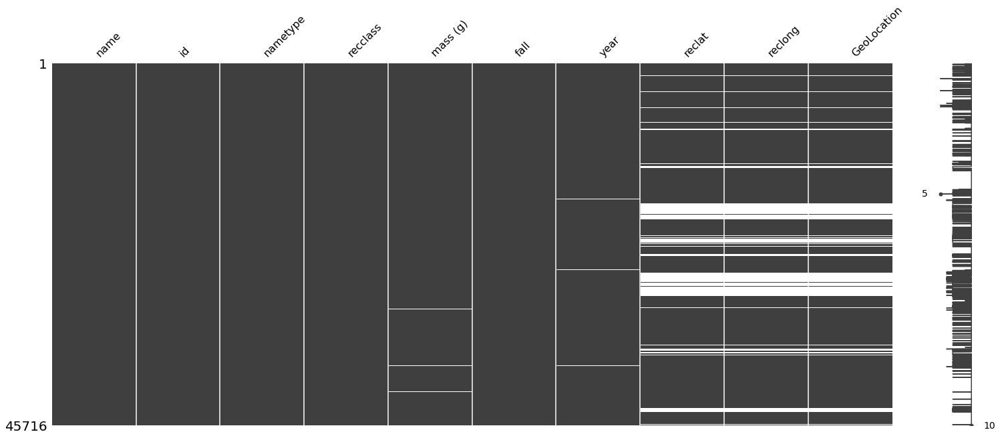

In [3]:
# Visualize missing values as a matrix
msno.matrix(df)

In [4]:
df.dropna()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
0,Aachen,1,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,"(50.775, 6.08333)"
1,Aarhus,2,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,"(56.18333, 10.23333)"
2,Abee,6,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,"(54.21667, -113.0)"
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,"(16.88333, -99.9)"
4,Achiras,370,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,"(-33.16667, -64.95)"
...,...,...,...,...,...,...,...,...,...,...
45711,Zillah 002,31356,Valid,Eucrite,172.0,Found,1990.0,29.03700,17.01850,"(29.037, 17.0185)"
45712,Zinder,30409,Valid,"Pallasite, ungrouped",46.0,Found,1999.0,13.78333,8.96667,"(13.78333, 8.96667)"
45713,Zlin,30410,Valid,H4,3.3,Found,1939.0,49.25000,17.66667,"(49.25, 17.66667)"
45714,Zubkovsky,31357,Valid,L6,2167.0,Found,2003.0,49.78917,41.50460,"(49.78917, 41.5046)"


In [5]:
df.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
0,Aachen,1,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,"(50.775, 6.08333)"
1,Aarhus,2,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,"(56.18333, 10.23333)"
2,Abee,6,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,"(54.21667, -113.0)"
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,"(16.88333, -99.9)"
4,Achiras,370,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,"(-33.16667, -64.95)"


In [6]:
len(df)

45716

In [7]:
df.describe()

,id,mass (g),year,reclat,reclong
count,45716.000000,4.558500e+04,45425.000000,38401.000000,38401.000000
mean,26889.735104,1.327808e+04,1991.828817,-39.122580,61.074319
std,16860.683030,5.749889e+05,25.052766,46.378511,80.647298
min,1.000000,0.000000e+00,860.000000,-87.366670,-165.433330
25%,12688.750000,7.200000e+00,1987.000000,-76.714240,0.000000
50%,24261.500000,3.260000e+01,1998.000000,-71.500000,35.666670
75%,40656.750000,2.026000e+02,2003.000000,0.000000,157.166670
max,57458.000000,6.000000e+07,2101.000000,81.166670,354.473330


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45716 entries, 0 to 45715
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         45716 non-null  object 
 1   id           45716 non-null  int64  
 2   nametype     45716 non-null  object 
 3   recclass     45716 non-null  object 
 4   mass (g)     45585 non-null  float64
 5   fall         45716 non-null  object 
 6   year         45425 non-null  float64
 7   reclat       38401 non-null  float64
 8   reclong      38401 non-null  float64
 9   GeoLocation  38401 non-null  object 
dtypes: float64(4), int64(1), object(5)
memory usage: 3.5+ MB


In [9]:
df.groupby('nametype').count()

,name,id,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
nametype,,,,,,,,,
Relict,75,75,75,26,75,74,70,70,70
Valid,45641,45641,45641,45559,45641,45351,38331,38331,38331


In [10]:
df.groupby('fall').count()

,name,id,nametype,recclass,mass (g),year,reclat,reclong,GeoLocation
fall,,,,,,,,,
Fell,1107,1107,1107,1107,1075,1107,1097,1097,1097
Found,44609,44609,44609,44609,44510,44318,37304,37304,37304


In [11]:
df.groupby('year').count()

,name,id,nametype,recclass,mass (g),fall,reclat,reclong,GeoLocation
year,,,,,,,,,
860.0,1,1,1,1,1,1,1,1,1
920.0,1,1,1,1,0,1,1,1,1
1399.0,1,1,1,1,1,1,1,1,1
1490.0,1,1,1,1,1,1,1,1,1
1491.0,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...
2010.0,1005,1005,1005,1005,1005,1005,1005,1005,1005
2011.0,713,713,713,713,713,713,713,713,713
2012.0,234,234,234,234,234,234,234,234,234


C:\Users\Kamen\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='year', ylabel='Density'>

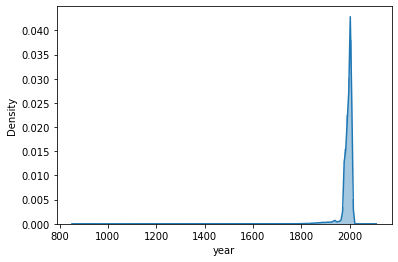

In [12]:
sns.distplot(df['year'], bins = 150)

In [13]:
df['mass (g)'].max()

60000000.0

In [14]:
df.groupby('recclass').count()

,name,id,nametype,mass (g),fall,year,reclat,reclong,GeoLocation
recclass,,,,,,,,,
Acapulcoite,54,54,54,54,54,53,38,38,38
Acapulcoite/Lodranite,6,6,6,6,6,6,5,5,5
Acapulcoite/lodranite,3,3,3,3,3,2,2,2,2
Achondrite-prim,9,9,9,9,9,9,3,3,3
Achondrite-ung,57,57,57,57,57,56,37,37,37
...,...,...,...,...,...,...,...,...,...
Unknown,7,7,7,0,7,6,5,5,5
Ureilite,300,300,300,300,300,300,214,214,214
Ureilite-an,4,4,4,4,4,4,3,3,3


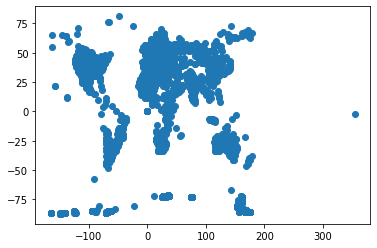

In [15]:
#Let's plot the data in a scatterplot
plt.scatter(x=df['reclong'], y=df['reclat'])
plt.rcParams['figure.figsize'] = (50,35)
plt.show()

In [16]:
#Let's improve the visual
fig = px.scatter_geo(df, lon='reclong', lat='reclat',hover_name='name')
fig.show()

In [17]:
fig2 = px.density_mapbox(df, lat='reclat', lon='reclong', radius = 1, center=dict(lat=0, lon=180), zoom=1.5, mapbox_style = "stamen-terrain")
fig2.show()

In [18]:
df['text'] = 'Name: ' + df['name'] + '; Mass of meteorite in grams: ' + df['mass (g)'].astype(str)

fig = go.Figure(data=go.Scattergeo(
        #locationmode = 'USA-states',
        lon = df['reclong'],
        lat = df['reclat'],
        text = df['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'square',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Viridis',
            cmin = 0,
            color = df['mass (g)'],
            cmax = df['mass (g)'].max(),
            colorbar_title="Mass of meteorite"
        )))

fig.update_layout(
        title = 'Meteorite landings',
        geo = dict(
            #scope='usa',
            #projection_type='albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5
        ),
    )
fig.show()

In [28]:
df.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,text
0,Aachen,1,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,"(50.775, 6.08333)",Name: Aachen; Mass of meteorite in grams: 21.0
1,Aarhus,2,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,"(56.18333, 10.23333)",Name: Aarhus; Mass of meteorite in grams: 720.0
2,Abee,6,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,"(54.21667, -113.0)",Name: Abee; Mass of meteorite in grams: 107000.0
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,"(16.88333, -99.9)",Name: Acapulco; Mass of meteorite in grams: 19...
4,Achiras,370,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,"(-33.16667, -64.95)",Name: Achiras; Mass of meteorite in grams: 780.0


In [31]:
#
df = df.dropna()
#df['year'] = df['year'].astype(int)

<AxesSubplot:>

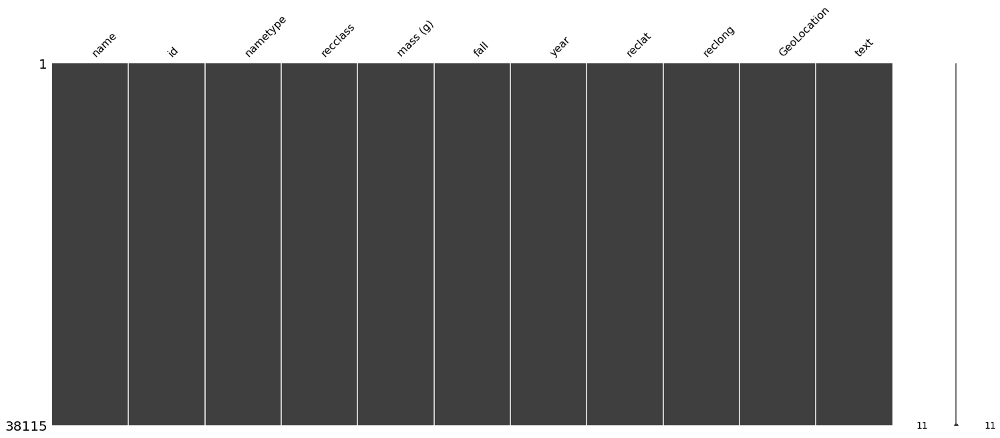

In [32]:
msno.matrix(df)

In [35]:
df['year'] = df['year'].astype(int)
df['year'] = df['year'].astype(str)

In [36]:
df.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,text
0,Aachen,1,Valid,L5,21.0,Fell,1880,50.77500,6.08333,"(50.775, 6.08333)",Name: Aachen; Mass of meteorite in grams: 21.0
1,Aarhus,2,Valid,H6,720.0,Fell,1951,56.18333,10.23333,"(56.18333, 10.23333)",Name: Aarhus; Mass of meteorite in grams: 720.0
2,Abee,6,Valid,EH4,107000.0,Fell,1952,54.21667,-113.00000,"(54.21667, -113.0)",Name: Abee; Mass of meteorite in grams: 107000.0
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976,16.88333,-99.90000,"(16.88333, -99.9)",Name: Acapulco; Mass of meteorite in grams: 19...
4,Achiras,370,Valid,L6,780.0,Fell,1902,-33.16667,-64.95000,"(-33.16667, -64.95)",Name: Achiras; Mass of meteorite in grams: 780.0


In [37]:
df['text'] = 'Name: ' + df['name'] + '; Mass of meteorite in grams: ' + df['mass (g)'].astype(str) + '; Year: ' + df['year']

In [38]:
df.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,text
0,Aachen,1,Valid,L5,21.0,Fell,1880,50.77500,6.08333,"(50.775, 6.08333)",Name: Aachen; Mass of meteorite in grams: 21.0...
1,Aarhus,2,Valid,H6,720.0,Fell,1951,56.18333,10.23333,"(56.18333, 10.23333)",Name: Aarhus; Mass of meteorite in grams: 720....
2,Abee,6,Valid,EH4,107000.0,Fell,1952,54.21667,-113.00000,"(54.21667, -113.0)",Name: Abee; Mass of meteorite in grams: 107000...
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976,16.88333,-99.90000,"(16.88333, -99.9)",Name: Acapulco; Mass of meteorite in grams: 19...
4,Achiras,370,Valid,L6,780.0,Fell,1902,-33.16667,-64.95000,"(-33.16667, -64.95)",Name: Achiras; Mass of meteorite in grams: 780...


In [39]:
df.text[0]

'Name: Aachen; Mass of meteorite in grams: 21.0; Year: 1880'

In [43]:
df['top 1% mass'] = df['mass (g)']>=np.percentile(df['mass (g)'], 99)

In [45]:
df.to_csv("meteorites_new")